#Day 2: Python Boot Camp
##Introduction to 'Classical Computer Vision Methods'

## **Please make your own copy of this notebook before making changes or beginning the exercises!**

## Agenda

1. [**Introduction to Matplotlib and Digital Images**](#digital-images)
2. [**Image processing using Python modules: Pillow, OpenCV, imageio, tifffile**](#modules)
3. [**Denoising microscopic images**](#denoising)
4. [**Thresholding and Image Segmentation**](#segmentation)
5. [**Feature Extraction, Edge Detection**](#edge-detection)
6. [**Morphological Operations**](#morph-operations)

**Where all the data files are stored:** [Drive link](https://drive.google.com/drive/folders/1_PVIkxc_KlMLJ04utkxZpY_M4fJJ9ZoM?usp=sharing)

**Classical Computer Vision** refers to the field of computer science that focuses on enabling computers to interpret and understand visual information from the world. Unlike modern approaches that often rely heavily on deep learning, classical computer vision techniques are based on traditional algorithms and mathematical models.

## **1. Introduction to Matplotlib and Digital Images**
<a name='digital-images'></a>

**Q: How are digital images stored?** <br>
A:
Digital images are stored in a computer as a grid of pixels, where each pixel represents a tiny portion of the image. The information about each pixel is encoded in binary format (combinations of 0s and 1s). Here is a detailed breakdown of how digital images are stored:

## A. Pixels and Resolution
- **Pixels**: The smallest unit of a digital image. Each pixel holds information about its color and intensity.
- **Resolution**: Defined by the number of pixels along the width and height of an image. For example, an image with a resolution of 1920x1080 has 1920 pixels in width and 1080 pixels in height.

## B. Color Representation
- **Grayscale Images**: Each pixel is represented by a single value indicating its intensity, ranging from black (0) to white (255) in an 8-bit grayscale image.
- **Color Images**: Typically represented using the RGB color model, where each pixel has three values corresponding to Red, Green, and Blue components. Each component usually ranges from 0 to 255 in an 8-bit image.

## C. Bit Depth
- **Bit Depth**: Determines the number of bits used to represent the color of a single pixel. Common bit depths include:
  - **1-bit**: Black and white (binary images).
  - **8-bit**: 256 shades of gray for grayscale images.
  - **24-bit**: True color images with 8 bits for each of the RGB channels, allowing for 16.7 million colors.
  - **32-bit**: Similar to 24-bit but with an additional 8-bit alpha channel for transparency.

## D. File Formats
Digital images are stored in various file formats, each with its own method of compression and metadata storage. Common formats include:

- **BMP (Bitmap)**: An uncompressed format that stores color information for each pixel.
- **JPEG (Joint Photographic Experts Group)**: A compressed format that uses lossy compression to reduce file size, suitable for photographs.
- **PNG (Portable Network Graphics)**: A lossless compressed format that supports transparency.
- **GIF (Graphics Interchange Format)**: Limited to 256 colors and supports simple animations.
- **TIFF (Tagged Image File Format)**: A flexible format that can use either lossless or lossy compression, commonly used in professional photography and printing.

## E. Storage Mechanism
Digital images are stored in binary format on a computer's storage device (e.g., hard drive, SSD) following the structure defined by their file format. The storage process includes:

1. **Header Information**: Contains metadata about the image, such as width, height, bit depth, and color format.
2. **Pixel Data**: The actual color information for each pixel in the image.
3. **Optional Metadata**: Additional information such as date, time, camera settings, and more.

## Example: Storing a Simple 2x2 RGB Image

Imagine a simple 2x2 RGB image with the following pixel values:
- Top-left: Red (255, 0, 0)
- Top-right: Green (0, 255, 0)
- Bottom-left: Blue (0, 0, 255)
- Bottom-right: White (255, 255, 255)

In a binary file, this image might be stored as follows:

1. **Header**: Contains information like image size (2x2), bit depth (24-bit), and color model (RGB).
2. **Pixel Data**: Stored in row-major order (left to right, top to bottom):
   - (255, 0, 0) (Red)
   - (0, 255, 0) (Green)
   - (0, 0, 255) (Blue)
   - (255, 255, 255) (White)

In binary form (assuming 8 bits per color channel), the pixel data would look like: \\
11111111 00000000 00000000 (Red)  \\
00000000 11111111 00000000 (Green) \\
00000000 00000000 11111111 (Blue) \\
11111111 11111111 11111111 (White) \\


# Importing and installing all the necessary libraries

In [ ]:
## Importing and installing all the necessary libraries

# !pip install -q Pillow
# !pip install gdown
# !pip install -q imageio
# !pip install opencv-python-headless
# !pip install tifffile scikit-image matplotlib imagecodecs
# !pip install ipywidgets

# from google.colab import drive
# drive.mount('/content/gdrive')

from skimage.restoration import denoise_wavelet, estimate_sigma
from google.colab.patches import cv2_imshow     # Required to display images in Colab
import tifffile as tiff
import cv2
import matplotlib.pyplot as plt
import imageio
import gdown
import requests
from PIL import Image
from io import BytesIO
import numpy as np
from skimage.feature import blob_log, blob_dog, blob_doh
import matplotlib.cm as cm
from scipy.ndimage import median_filter
import ipywidgets as widgets
from ipywidgets import interact, interactive, fixed, interact_manual
from IPython.display import display
from skimage import filters, feature
from skimage.feature import blob_log
from skimage.color import rgb2gray

from skimage import io, measure, morphology, segmentation, util
from skimage.color import label2rgb
from skimage.morphology import skeletonize, square, remove_small_objects
from skimage.graph import route_through_array
from scipy.ndimage import distance_transform_edt
from scipy.ndimage import binary_dilation, binary_erosion
from skimage import exposure


# An introduction to Matplotlib

* Line Plot

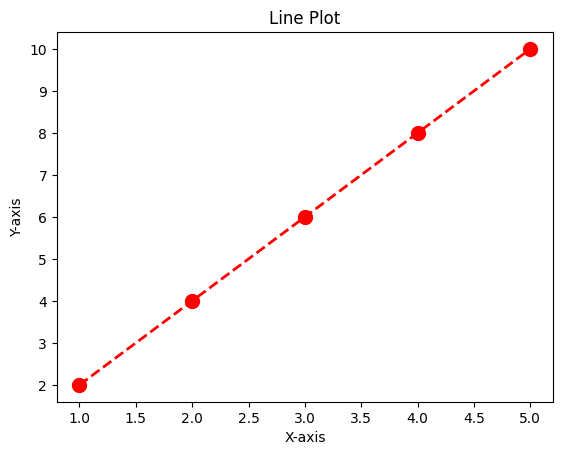

In [ ]:
# Sample data
x = [1, 2, 3, 4, 5]
y = [2, 4, 6, 8, 10]

plt.plot(x, y, color='red', marker='o', linestyle='dashed',linewidth=2, markersize=10)
plt.title('Line Plot')
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.show()

* Scatter Plot

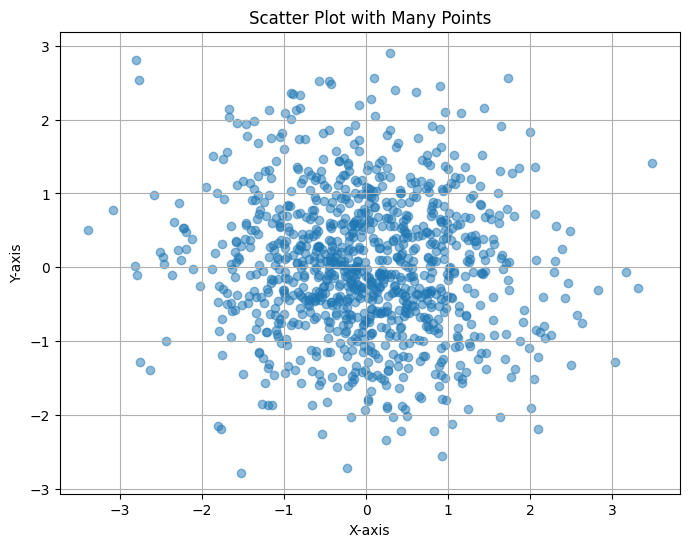

In [ ]:
# Generating a larger dataset
num_points = 1000
x = np.random.normal(0, 1, num_points)
y = np.random.normal(0, 1, num_points)

plt.figure(figsize=(8, 6))
plt.scatter(x, y, marker='o', alpha=0.5)  # Adjust alpha for transparency

plt.title('Scatter Plot with Many Points')
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.grid(True)
plt.show()

* Bar Plot

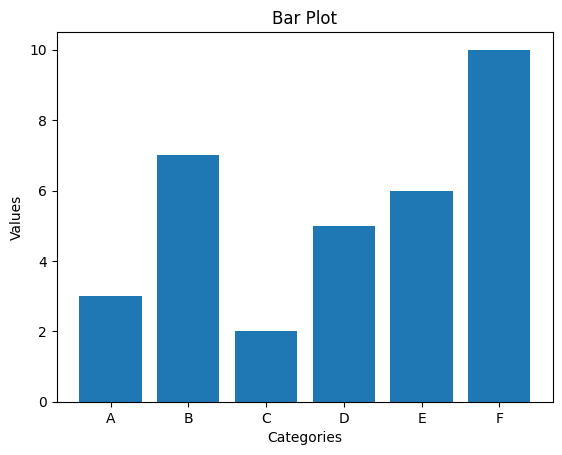

In [ ]:
# Sample data
categories = ['A', 'B', 'C', 'D', 'E', 'F']
values = [3, 7, 2, 5, 6, 10]

plt.bar(categories, values)
plt.title('Bar Plot')
plt.xlabel('Categories')
plt.ylabel('Values')
plt.show()

* Histogram

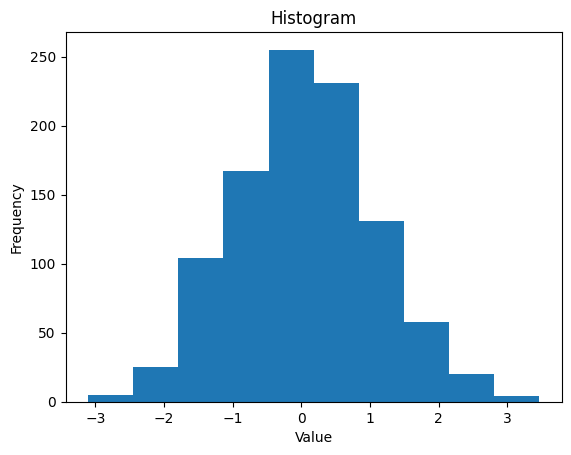

In [ ]:
# Generate some random data
data = np.random.normal(0, 1, 1000)

plt.hist(data, bins=10)
plt.title('Histogram')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.show()

* Pie Chart

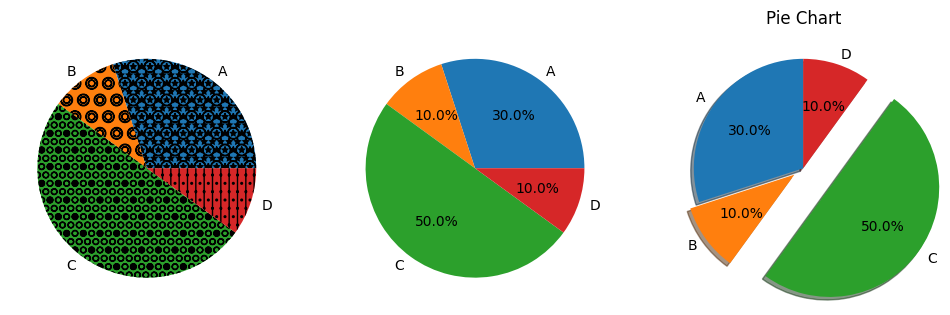

In [ ]:
# Sample data
sizes = [30, 10, 50, 10]
labels = ['A', 'B', 'C', 'D']


fig, axes = plt.subplots(1,3,figsize=(12,12))
explode = (0, 0.1, 0.3, 0)  # Explode the 2nd slice (B)

# Define custom shadow parameters
shadow_params = {'offsetx': -0.04, 'offsety': 0.04, 'edgecolor': 'none', 'alpha': 0.9}

axes[0].pie(sizes, labels=labels, hatch=['**O', 'oO', 'O.O', '.||.'])
axes[1].pie(sizes, labels=labels, autopct='%1.1f%%')
axes[2].pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%', shadow=shadow_params, startangle=90)
plt.title('Pie Chart')
plt.show()


* Box Plot

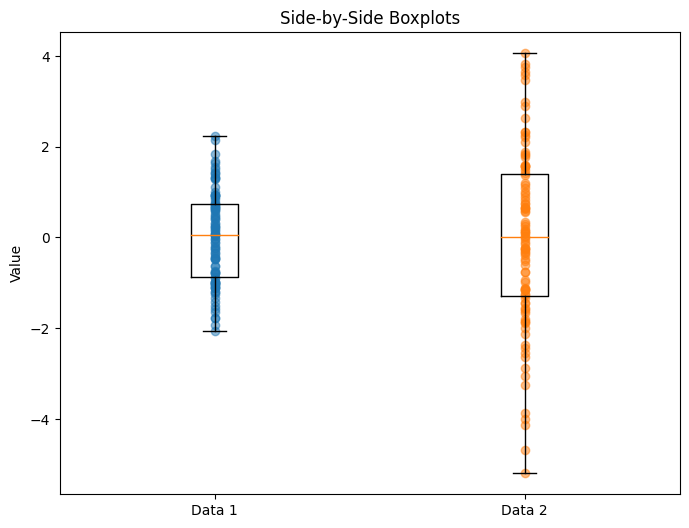

In [ ]:
# Generating sample data for two groups
data1 = np.random.normal(0, 1, 100)
data2 = np.random.normal(0, 2, 100)

plt.figure(figsize=(8, 6))

# Plotting both boxplots side by side
plt.boxplot([data1, data2], positions=[1, 2])
plt.xticks([1, 2], ['Data 1', 'Data 2'])
plt.title('Side-by-Side Boxplots')
plt.ylabel('Value')

# Adding individual data points
plt.scatter(np.full_like(data1, 1), data1, alpha=0.5)  # data1 points
plt.scatter(np.full_like(data2, 2), data2, alpha=0.5)  # data2 points

plt.show()

* Violin Plot

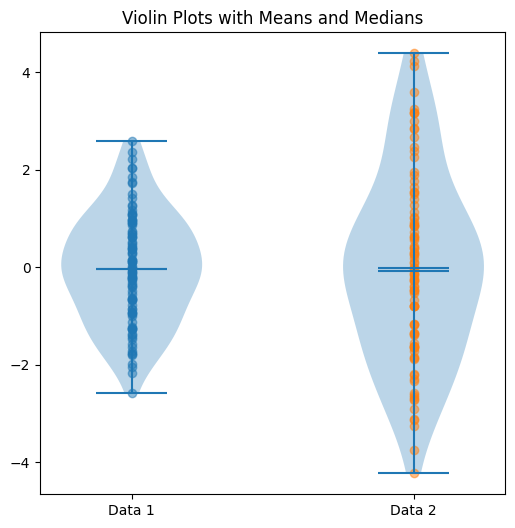

In [ ]:
# Generating sample data for two groups
data1 = np.random.normal(0, 1, 100)
data2 = np.random.normal(0, 2, 100)

plt.figure(figsize=(6, 6))

# Plotting violin plots
plt.subplot(1, 1, 1)  # 1 row, 3 columns, 2nd subplot

# Adding label
plt.violinplot([data1, data2], positions=[1, 2], showmeans=True, showmedians=True)
plt.xticks([1, 2], ['Data 1', 'Data 2'])
plt.title('Violin Plots with Means and Medians')

# Adding individual data points
plt.scatter(np.full_like(data1, 1), data1, alpha=0.5)  # data1 points
plt.scatter(np.full_like(data2, 2), data2, alpha=0.5)  # data2 points

plt.show()

* Stacked Bar Plot

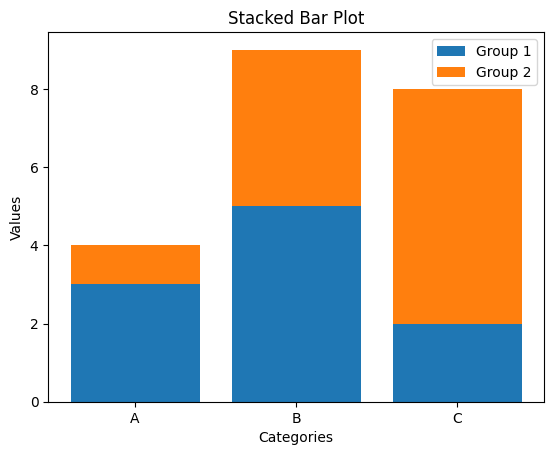

In [ ]:
# Sample data
categories = ['A', 'B', 'C']
values1 = [3, 5, 2]
values2 = [1, 4, 6]

plt.bar(categories, values1, label='Group 1')
plt.bar(categories, values2, bottom=values1, label='Group 2')
plt.title('Stacked Bar Plot')
plt.xlabel('Categories')
plt.ylabel('Values')
plt.legend()
plt.show()

* Filled Area Plot

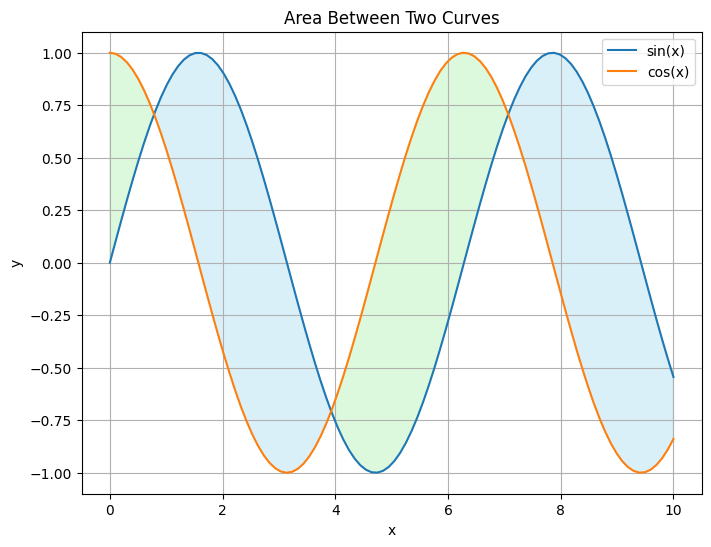

In [ ]:
# Generate data
x = np.linspace(0, 10, 100)
y1 = np.sin(x)
y2 = np.cos(x)

plt.figure(figsize=(8, 6))

# Plot y1 and y2
plt.plot(x, y1, label='sin(x)')
plt.plot(x, y2, label='cos(x)')

# Fill the area between y1 and y2
plt.fill_between(x, y1, y2, where=(y1 > y2), interpolate=True, color='skyblue', alpha=0.3)
plt.fill_between(x, y1, y2, where=(y1 <= y2), interpolate=True, color='lightgreen', alpha=0.3)

# Customize plot
plt.title('Area Between Two Curves')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()

plt.grid(True)
plt.show()

* Contour Plot

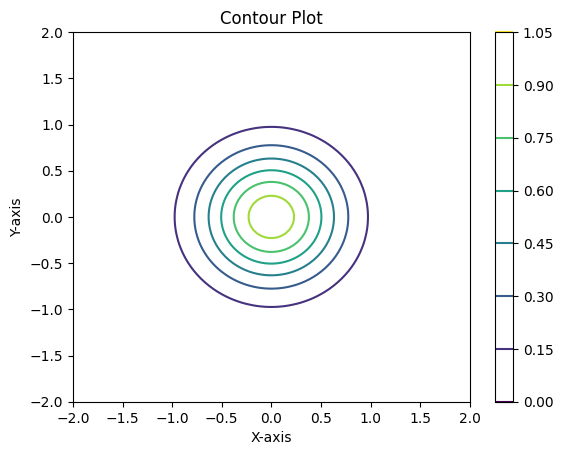

In [ ]:
# Generate some random data
x = np.linspace(-2.0, 2.0, 100)
y = np.linspace(-2.0, 2.0, 100)
X, Y = np.meshgrid(x, y)
Z = np.exp(-2*(X**2 + Y**2))

plt.contour(X, Y, Z)
plt.title('Contour Plot')
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.colorbar()
plt.show()

* Polar Plot

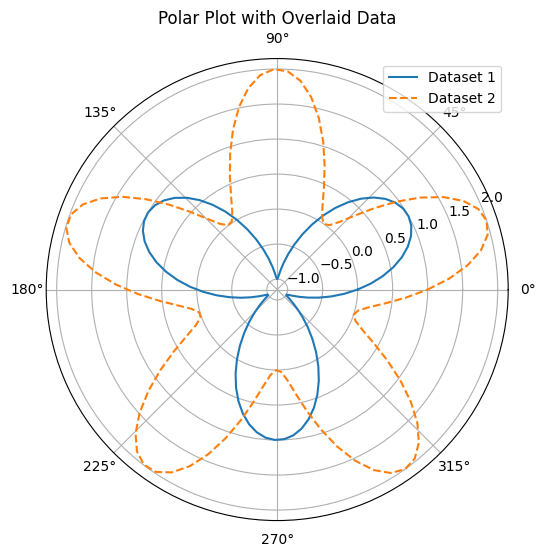

In [ ]:
# Data for polar plot 1
theta1 = np.linspace(0, 2*np.pi, 100)
r1 = np.sin(3*theta1)

# Data for polar plot 2
theta2 = np.linspace(0, 2*np.pi, 100)
r2 = 1 + np.cos(5*theta2)

# Create figure and polar axis
plt.figure(figsize=(6, 6))
ax = plt.subplot(111, polar=True)

# Plot both datasets on the same polar axis
ax.plot(theta1, r1, label='Dataset 1')
ax.plot(theta2, r2, label='Dataset 2', linestyle='--')

# Add title and legend
ax.set_title('Polar Plot with Overlaid Data')
ax.legend()

plt.show()


* Image Plot

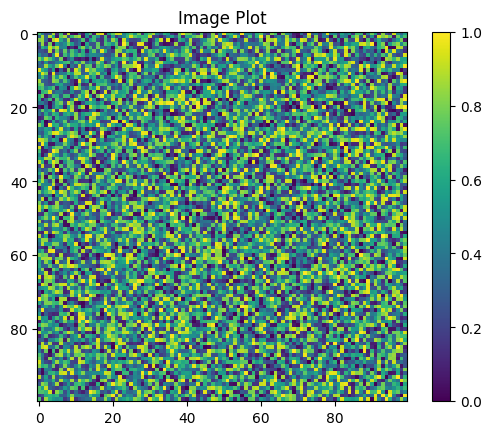

In [ ]:
# Generate a simple image
data = np.random.rand(100, 100)

plt.imshow(data, cmap='viridis', interpolation='nearest', vmin = 0, vmax = 1)
plt.title('Image Plot')
plt.colorbar()
plt.show()

# A demonstration of digital image storaging

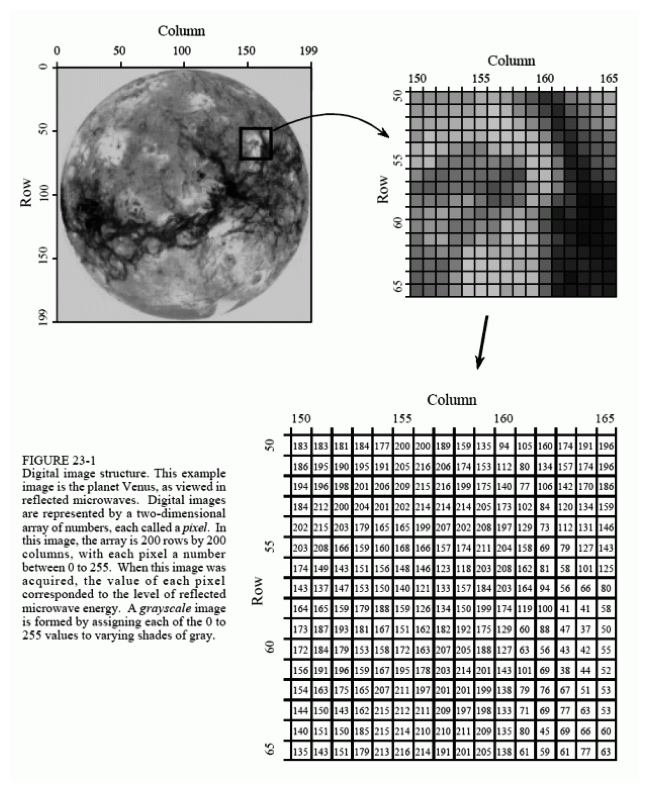

In [ ]:
## A demonstration of digital image storage

# Step 1: Define the file ID and generate the download link
file_id = '1c2uHkhY9asHUR-6G_JBeT8O1p1lKEsAQ'
download_url = f'https://drive.google.com/uc?export=download&id={file_id}'

# Step 2: Download the image
response = requests.get(download_url)
image = Image.open(BytesIO(response.content))

# Step 3: Display the image
fig = plt.figure(figsize=(10, 10), dpi=100) # Adjust figsize and dpi as needed
plt.imshow(image)
plt.axis('off') # Hide the axis
plt.show()


## **2. Image processing using Python modules: Pillow, OpenCV, imageio, tifffile**
<a name='modules'></a>

Python has several powerful libraries and modules for image processing. These libraries provide a wide range of functions for manipulating and analyzing images, making them suitable for various applications such as computer vision, machine learning, graphics, and more. Here are some of the most commonly used Python image processing libraries:

**A. Pillow:** \\
* Loading a .tif file

Downloading...
From: https://drive.google.com/uc?id=12m5zQ-QuL6mlUJmajGImZQIP0yCoDyR0
To: /content/image.tif
100%|██████████| 1.31M/1.31M [00:00<00:00, 70.9MB/s]


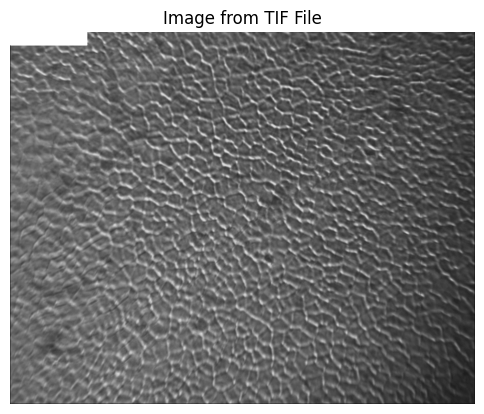

In [ ]:
# Download the TIFF file from the shared Google Drive link
url = 'https://drive.google.com/uc?id=12m5zQ-QuL6mlUJmajGImZQIP0yCoDyR0'
output = '/content/image.tif'  # Path to save the downloaded file

gdown.download(url, output, quiet=False)

# Open the TIFF file using Pillow
img1 = Image.open(output)

# Display the image
plt.figure(figsize=(6, 6))
plt.imshow(img1, cmap='gray')  # Display the image (assuming grayscale)
plt.axis('off')  # Hide axes
plt.title('Image from TIF File')
plt.show()


**B. imageio:** \\
* Loading a .tiff stack

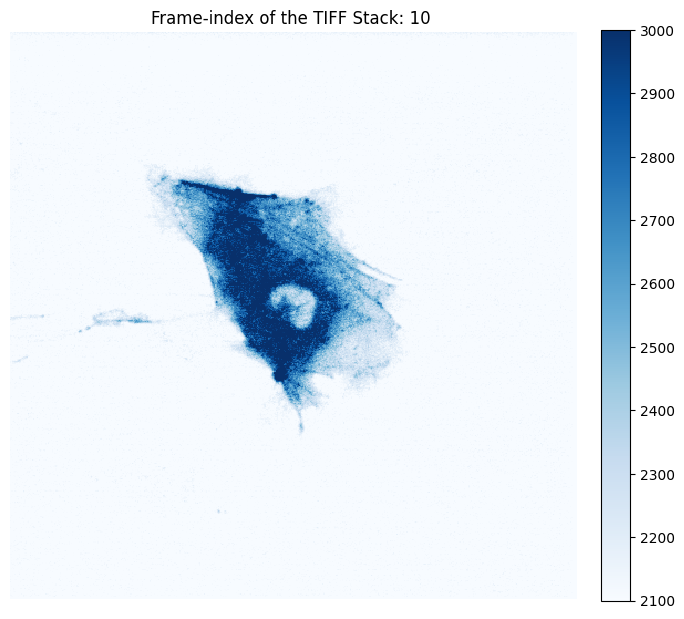

In [ ]:
# Download the TIFF stack from the shared Google Drive link
# url = 'https://drive.google.com/uc?id=1NfrE1nRe9IUs9iS2LiEnQxytbP2Nsj1n'
# output = '/content/tiff_stack.tif'  # Path to save the downloaded file

# gdown.download(url, output, quiet=False)

# # Load the TIFF stack
# tif_stack = imageio.volread(output)
frame_index = 10
first_frame = tif_stack[frame_index]         # we can choose any other frame too

# Display the first frame of the TIFF stack
plt.figure(figsize=(8, 8),dpi = 100)
# plt.imshow(first_frame, cmap='gray')       # Display the first frame
plt.imshow(first_frame, cmap='Blues', interpolation='none', vmin = 2100, vmax = 3000)
im_ratio = first_frame.shape[0]/first_frame.shape[1]
plt.colorbar(fraction=0.046*im_ratio, pad=0.04)   # affects the colorbar parameters
plt.axis('off')  # Hide axes
plt.title(f'Frame-index of the TIFF Stack: {frame_index} ')
plt.show()



**C. OpenCV** \\
* Loading a .tif file

Downloading...
From: https://drive.google.com/uc?id=1xOWdDA2CGaYWFCHIsVk9rWqFWlIjFyTy
To: /content/image.tif
100%|██████████| 787k/787k [00:00<00:00, 108MB/s]


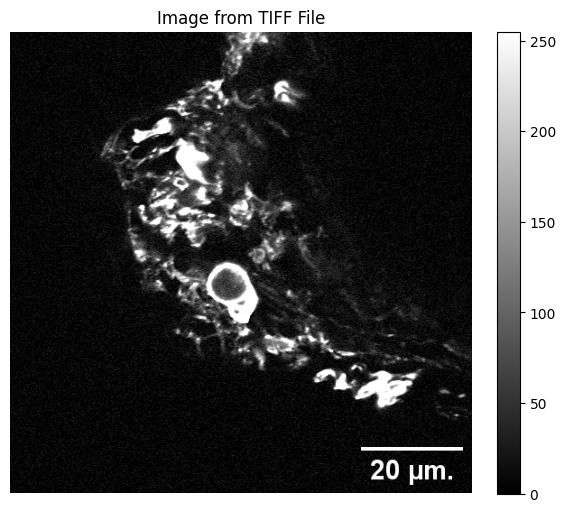

In [ ]:
# Download the TIFF file from the shared Google Drive link
url = 'https://drive.google.com/uc?id=1xOWdDA2CGaYWFCHIsVk9rWqFWlIjFyTy'
output = '/content/image.tif'  # Path to save the downloaded file

gdown.download(url, output, quiet=False)

# Load the TIFF file using OpenCV
img2 = cv2.imread(output, cv2.IMREAD_UNCHANGED)

# Display the image
plt.figure(figsize=(8, 6))
plt.imshow(img2, cmap='gray')  # Display the image (assuming grayscale)
im_ratio = first_frame.shape[0]/first_frame.shape[1]
plt.colorbar(fraction=0.046*im_ratio, pad=0.04)   # affects the colorbar parameters
plt.axis('off')  # Hide axes
plt.title('Image from TIFF File')
plt.show()


* Normalize the image (scaling pixel values to [0, 1])

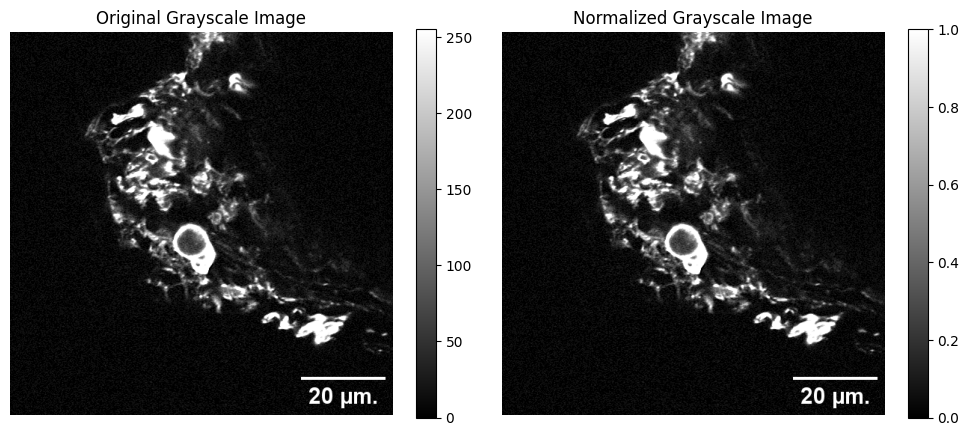

In [ ]:
normalized_image = img2.astype(float) / 255.0

# Display the original and normalized images
plt.figure(figsize=(10, 10))

# Original grayscale image
plt.subplot(1, 2, 1)
plt.imshow(img2, cmap='gray'); plt.colorbar(shrink = 0.4)
plt.title('Original Grayscale Image')
plt.axis('off')

# Normalized grayscale image
plt.subplot(1, 2, 2)
plt.imshow(normalized_image, cmap='gray'); plt.colorbar(shrink = 0.4)
plt.title('Normalized Grayscale Image')
plt.axis('off')

plt.tight_layout()
plt.show()


* Method to adjust contrast: multiply pixel values by a contrast factor

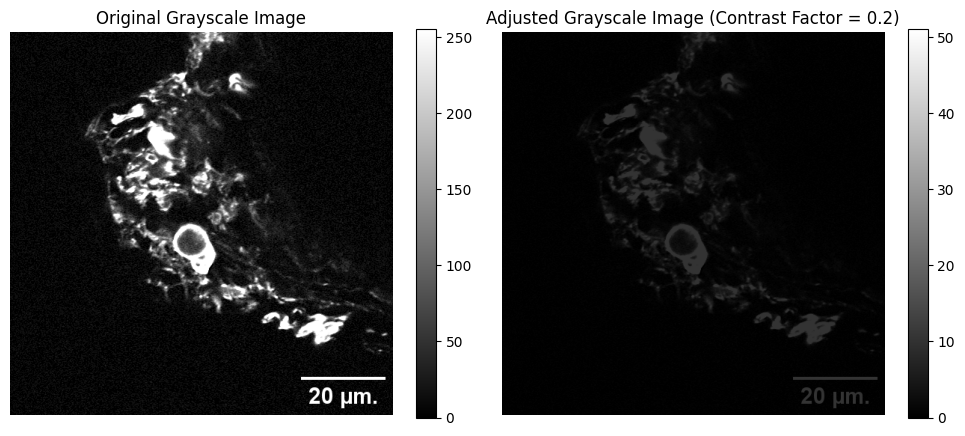

In [ ]:
contrast_factor = 0.2  # Adjust this value as needed
adjusted_image = np.clip(contrast_factor * img2, 0, 255).astype(np.uint8)

# Display the original and adjusted images
plt.figure(figsize=(10, 10),dpi=100)

# Original grayscale image
plt.subplot(1, 2, 1)
plt.imshow(img2, cmap='gray'); plt.colorbar(shrink = 0.4)
plt.title('Original Grayscale Image')
plt.axis('off')

# Adjusted grayscale image
plt.subplot(1, 2, 2)
plt.imshow(adjusted_image, cmap='gray'); plt.colorbar(shrink = 0.4)
plt.title(f'Adjusted Grayscale Image (Contrast Factor = {contrast_factor})')
plt.axis('off')

plt.tight_layout()
plt.show()

**4. tifffile**

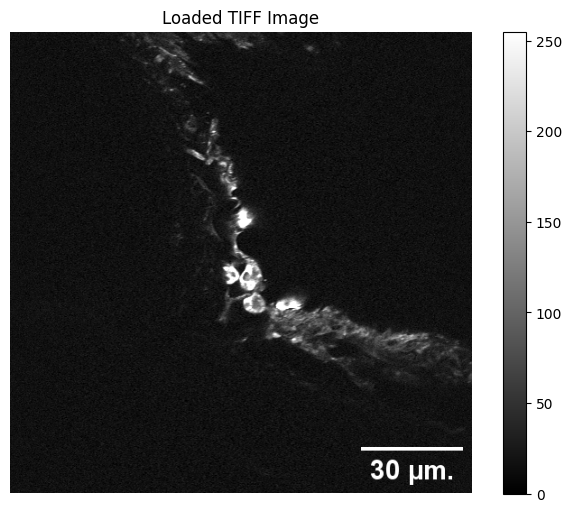

In [ ]:
# # Define the shared Google Drive link and the destination path
# url = 'https://drive.google.com/uc?id=1swVQG7DuBymjgHb7KXQ6WuN1cbVuuE0A'
# output = '/content/image.tif'  # Path to save the downloaded file

# # Download the file
# gdown.download(url, output, quiet=False)

# # Load the .tif image using tifffile
# image = tiff.imread(output)

# Display the image (example with matplotlib)
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6),dpi=100)
plt.imshow(image[:,:,2],cmap='gray')  # Assuming grayscale image
plt.axis('off'); plt.colorbar();
plt.title('Loaded TIFF Image')
plt.show()

* Saving a Matrix as a Compressed and Uncompressed .tif Using tifffile

In [ ]:
# Example matrix (replace with your own matrix)
examp_matrix = adjusted_image

# Define the output path for the TIFF file
output_path_comp = '/content/gdrive/My Drive/adjusted_contrast_comp.tif'
output_path_uncomp = '/content/gdrive/My Drive/adjusted_contrast_uncomp.tif'


# Save the matrix as a compressed and uncompressed TIFF file
tiff.imwrite(output_path_comp, examp_matrix , compression='zlib')
tiff.imwrite(output_path_uncomp, examp_matrix , compression=None)  # 'None' for no compression (uncompressed)

print(f"Matrix saved as compressed TIFF file: {output_path_comp}")
print(f"Matrix saved as uncompressed TIFF file: {output_path_uncomp}")


Matrix saved as compressed TIFF file: /content/gdrive/My Drive/adjusted_contrast_comp.tif
Matrix saved as uncompressed TIFF file: /content/gdrive/My Drive/adjusted_contrast_uncomp.tif


## 3. Denoising microscopic images
<a name='denoising'></a>

* Adding noises to an existing image frame

Downloading...
From: https://drive.google.com/uc?id=1qK7YsPDWqJ0stYEN8ecdHrhH_burExhs
To: /content/grayscale_image.tif
100%|██████████| 1.31M/1.31M [00:00<00:00, 136MB/s]


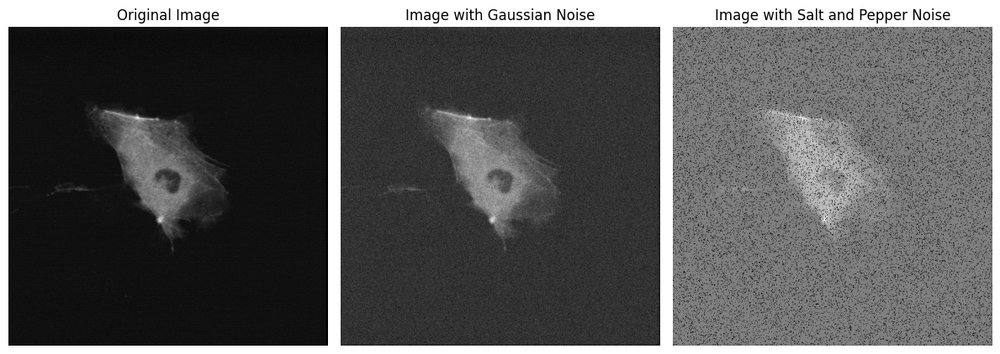

In [ ]:
def add_salt_and_pepper_noise(image, salt_ratio=0.05, pepper_ratio=0.05):
    """
    Adds salt and pepper noise to an image.

    Args:
        image (numpy.ndarray): Input image.
        salt_ratio (float): Ratio of salt noise (default: 0.05).
        pepper_ratio (float): Ratio of pepper noise (default: 0.05).

    Returns:
        numpy.ndarray: Image with salt and pepper noise.
    """
    row, col = image.shape
    salt = np.random.rand(row, col) < salt_ratio
    pepper = np.random.rand(row, col) < pepper_ratio
    noisy_image = np.copy(image)
    noisy_image[salt] = 1
    noisy_image[pepper] = 0
    return noisy_image


# Step 1: Load the image

# url = 'https://drive.google.com/uc?id=1eT7CXzylSNpLIJNlzdNmYjZFKrG7Nl1H'
url = 'https://drive.google.com/uc?id=1qK7YsPDWqJ0stYEN8ecdHrhH_burExhs'
output = '/content/grayscale_image.tif'  # Output path to save the downloaded image

gdown.download(url, output, quiet=False)

# Step 2: Load the grayscale .tif image using tifffile
# image = tiff.imread(output)

image = first_frame

# Step 2: Add Gaussian noise
mean = 0
variance = 10000
sigma = np.sqrt(variance)
gaussian_noise = np.random.normal(mean, sigma, image.shape)
noisy_image_gaussian = image + gaussian_noise

# Step 3: Add Salt and Pepper noise
noisy_image_salt_pepper = add_salt_and_pepper_noise(image)

# Step 4: Display the images side by side
plt.figure(figsize=(12, 6))

# Original image
plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

# Noisy image with Gaussian noise
plt.subplot(1, 3, 2)
plt.imshow(noisy_image_gaussian, cmap='gray')
plt.title('Image with Gaussian Noise')
plt.axis('off')

# Noisy image with Salt and Pepper noise
plt.subplot(1, 3, 3)
plt.imshow(noisy_image_salt_pepper, cmap='gray')
plt.title('Image with Salt and Pepper Noise')
plt.axis('off')

plt.tight_layout()
plt.show()


* **Denoising Method-1: Wavelet Denoising** \\
Wavelet denoising relies on the wavelet representation of the image. Gaussian noise tends to be represented by small values in the wavelet domain and can be removed by setting coefficients below a given threshold to zero (hard thresholding) or shrinking all coefficients toward zero by a given amount (soft thresholding).

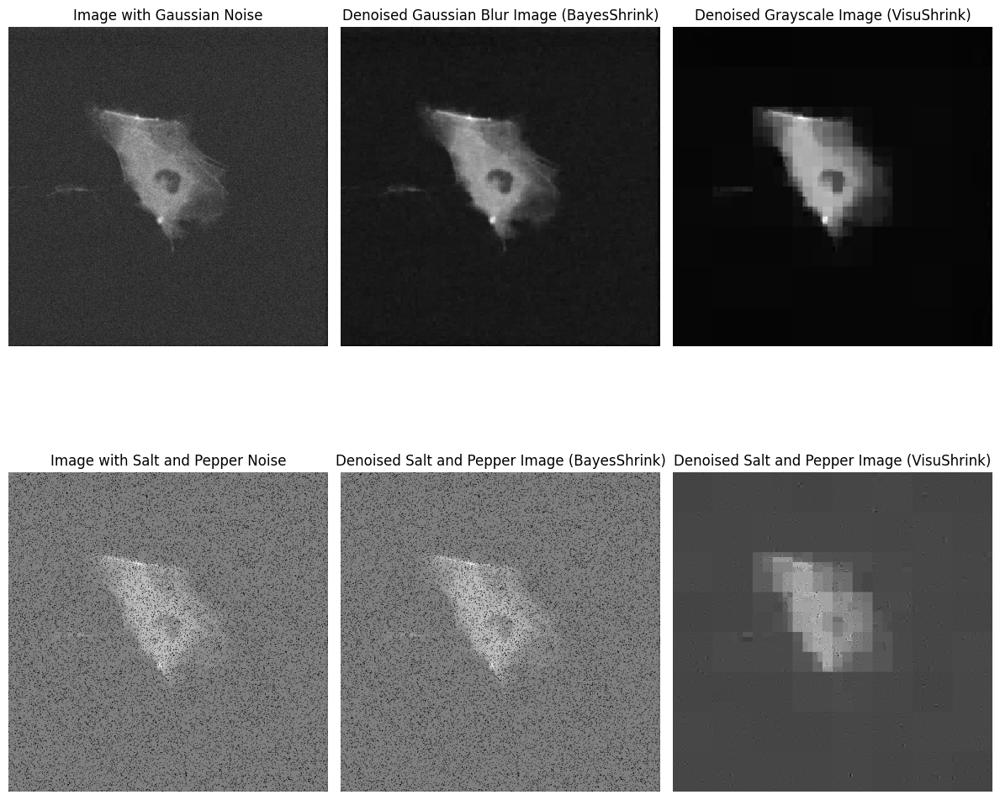

In [ ]:
# Denoise the Gaussian-blur image using wavelet denoising
sigma_est = estimate_sigma(noisy_image_gaussian, channel_axis=None)
denoised_gauss_bayes = denoise_wavelet(noisy_image_gaussian, method='BayesShrink')
denoised_gauss_visu = denoise_wavelet(noisy_image_gaussian, method='VisuShrink', sigma=sigma_est)

# Denoise the salt and pepper noise image using wavelet denoising
sigma_est = estimate_sigma(noisy_image_salt_pepper, channel_axis=None)
denoised_salt_pepper_bayes = denoise_wavelet(noisy_image_salt_pepper , method='BayesShrink')
denoised_salt_pepper_visu = denoise_wavelet(noisy_image_salt_pepper , method='VisuShrink', sigma=sigma_est)

plt.figure(figsize=(12, 12))

# Display the noisy image with Gaussian noise
plt.subplot(2, 3, 1)
plt.imshow(noisy_image_gaussian, cmap='gray')
plt.title('Image with Gaussian Noise')
plt.axis('off')

# Display the denoised Gaussian-blur image by 'BayesShrink'
plt.subplot(2, 3, 2)
plt.imshow(denoised_gauss_bayes, cmap='gray')
plt.title('Denoised Gaussian Blur Image (BayesShrink)')
plt.axis('off')

# Display the denoised Gaussian-blur image by 'VisuShrink'
plt.subplot(2, 3, 3)
plt.imshow(denoised_gauss_visu, cmap='gray')
plt.title('Denoised Grayscale Image (VisuShrink)')
plt.axis('off')

# Display the noisy image with Salt and Pepper noise
plt.subplot(2, 3, 4)
plt.imshow(noisy_image_salt_pepper, cmap='gray')
plt.title('Image with Salt and Pepper Noise')
plt.axis('off')

# Display the denoised salt and pepper image by 'BayesShrink'
plt.subplot(2, 3, 5)
plt.imshow(denoised_salt_pepper_bayes, cmap='gray')
plt.title('Denoised Salt and Pepper Image (BayesShrink)')
plt.axis('off')

# Display the denoised salt and pepper image by 'VisuShrink'
plt.subplot(2, 3, 6)
plt.imshow(denoised_salt_pepper_visu, cmap='gray')
plt.title('Denoised Salt and Pepper Image (VisuShrink)')
plt.axis('off')

plt.tight_layout()
plt.show()

* **Denoising Method-2: Median filter** \\
It is very effective at removing impulse noise, the “salt and pepper” noise, in the image. The principle of the median filter is to replace the gray level of each pixel by the median of the gray levels in a neighborhood of the pixels, instead of using the average operation.

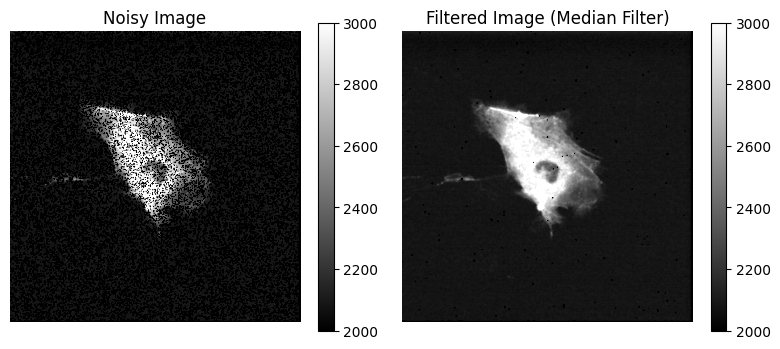

In [ ]:
# Apply median filtering
filtered_image = median_filter(noisy_image_salt_pepper, size=3)  # Adjust size as needed

# Display the images side by side
plt.figure(figsize=(8, 8))

# Original noisy image
plt.subplot(1, 2, 1)
plt.imshow(noisy_image_salt_pepper, cmap='gray', vmin = 2000, vmax = 3000); plt.colorbar(shrink = 0.4);
plt.title('Noisy Image')
plt.axis('off')

# Filtered image
plt.subplot(1, 2, 2)
plt.imshow(filtered_image, cmap='gray', vmin = 2000, vmax = 3000); plt.colorbar(shrink = 0.4);
plt.title('Filtered Image (Median Filter)')
plt.axis('off')

plt.tight_layout()
plt.show()


*  **Denoising Method-3:** **Bilateral Filtering** \\
It is highly effective in noise removal while keeping edges sharp.  
Bilateral filtering is composed of 2 different Gaussians. The Gaussian function of space makes sure that only nearby pixels are considered for blurring, while the Gaussian function of intensity difference makes sure that only those pixels with similar intensities to the central pixel are considered for blurring. So it preserves the edges since pixels at edges will have large intensity variation



Downloading...
From: https://drive.google.com/uc?id=1eT7CXzylSNpLIJNlzdNmYjZFKrG7Nl1H
To: /content/image.tif
100%|██████████| 898k/898k [00:00<00:00, 98.5MB/s]


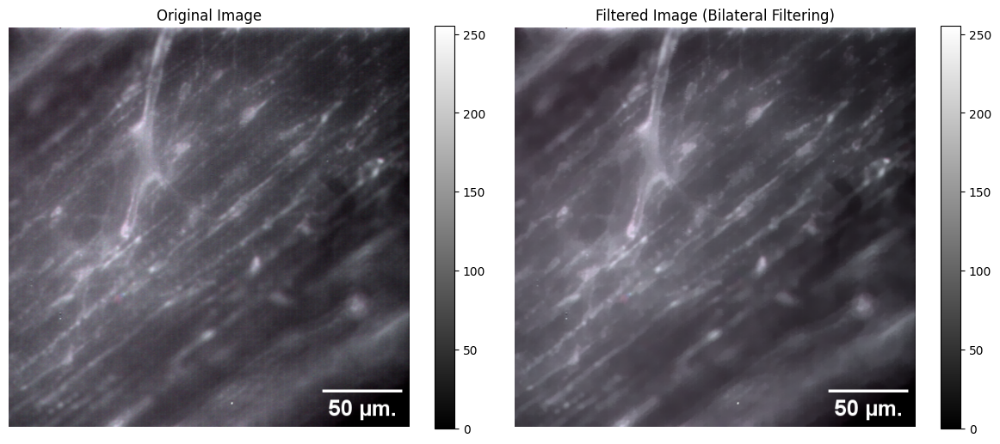

In [ ]:
# Download the TIFF file from the shared Google Drive link
url = 'https://drive.google.com/uc?id=1eT7CXzylSNpLIJNlzdNmYjZFKrG7Nl1H'
output = '/content/image.tif'  # Path to save the downloaded file

gdown.download(url, output, quiet=False)

# Load the TIFF file using OpenCV
img2 = cv2.imread(output, cv2.IMREAD_UNCHANGED)

# Apply bilateral filter

bilateral_denoised = cv2.bilateralFilter(np.uint8(img2),15, 12, 9)

# Display the images side by side
plt.figure(figsize=(12, 12),dpi=100)

# Original noisy image
plt.subplot(1, 2, 1)
plt.imshow(img2, cmap='gray'); plt.colorbar(shrink = 0.4);
plt.title('Original Image')
plt.axis('off')

# Filtered image
plt.subplot(1, 2, 2)
plt.imshow(bilateral_denoised, cmap='gray'); plt.colorbar(shrink = 0.4);
plt.title('Filtered Image (Bilateral Filtering)')
plt.axis('off')

plt.tight_layout()
plt.show()



*  **Denoising Method-4:** **Contrast Limited Adaptive Histogram Equalization (CLAHE)** \\
Essentially, histogram equalization works by: \\
a. Computing a histogram of image pixel intensities \\
b. Evenly spreading out and distributing the most frequent pixel values (i.e., the ones with the largest counts in the histogram) \\
c. Giving a linear trend to the cumulative distribution function (CDF) \\
The result of applying histogram equalization is an image with higher global contrast.

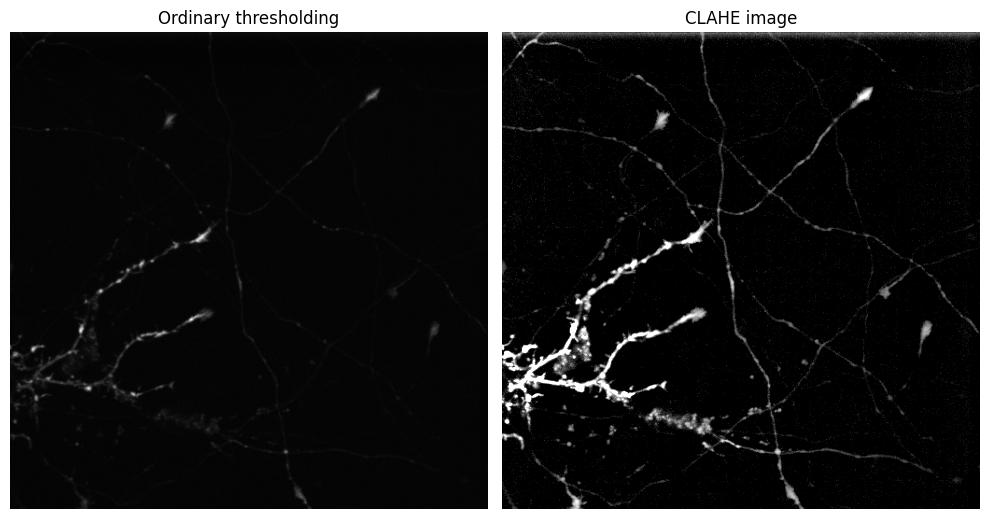

In [ ]:
# # Download the TIFF file from the shared Google Drive link
# url = 'https://drive.google.com/uc?id=1-k49CSloItMjCIDZs2Qx19U8CX3q9Xu2'
# output = '/content/image.tif'  # Path to save the downloaded file

# gdown.download(url, output, quiet=False)

# # Load the TIFF file using OpenCV
# img2 = cv2.imread(output, cv2.IMREAD_UNCHANGED)

# The declaration of CLAHE
# clipLimit -> Threshold for contrast limiting
clahe = cv2.createCLAHE(clipLimit=40.0, tileGridSize=(10,10))
final_img = clahe.apply(img2) + 30;


# Display the images side by side
plt.figure(figsize=(10, 10),dpi=100)

# Original noisy image
plt.subplot(1, 2, 1)
plt.imshow(img2, cmap='gray');
plt.title('Ordinary thresholding')
plt.axis('off')

# Filtered image
plt.subplot(1, 2, 2)
plt.imshow(final_img, cmap='gray', vmin=3000, vmax=9000);
plt.title('CLAHE image')
plt.axis('off')

plt.tight_layout()
plt.show()

## **4. Thresholding and Image Segmentation**
<a name='segmentation'></a>
* **Global Thresholding** \\
 For every pixel, the same threshold value is applied. If the pixel value is smaller than the threshold, it is set to 0, otherwise it is set to a maximum value.

In [ ]:
# Download the image from the shared Google Drive link
url = 'https://drive.google.com/uc?id=1HNUvf8j1CI94MDsz7gQgX6NvO6Bygzgv'
output = '/content/grayscale_image.tif'
gdown.download(url, output, quiet=False)

# Load the grayscale image using OpenCV
image = cv2.imread(output, cv2.IMREAD_GRAYSCALE)

# Normalize the image to range [0, 1]
normalized_image = image / 255.0

# Function to display the image with a given threshold
def local_thresholding_demo(block_size, C):
    # Convert normalized image back to 8-bit for adaptive thresholding
    image_8bit = (normalized_image * 255).astype('uint8')

    # Apply (global) adaptive thresholding
    thresh_image = cv2.adaptiveThreshold(image_8bit, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                         cv2.THRESH_BINARY, block_size, C)
    # Normalize the thresholded image to range [0, 1]
    thresh_image = thresh_image / 255.0

    # Display the original and thresholded images side by side
    plt.figure(figsize=(12, 6))

    # Original image
    plt.subplot(1, 2, 1)
    plt.imshow(normalized_image, cmap='gray', vmin=0, vmax=0.1)
    plt.title('Original Grayscale Image (Normalized)')
    plt.axis('off')

    # Thresholded image
    plt.subplot(1, 2, 2)
    plt.imshow(thresh_image, cmap='gray', vmin=0, vmax=0.1)
    plt.title(f'Global Thresholded Image (Block Size: {block_size}, C: {C})')
    plt.axis('off')

    plt.show()

# Create interactive sliders for block size and C value
block_size_slider = widgets.IntSlider(min=3, max=51, step=2, value=11)
C_slider = widgets.FloatSlider(min=-20, max=20, step=0.5, value=0)

interact(local_thresholding_demo, block_size=block_size_slider, C=C_slider)

# Display the interactive widgets
display(block_size_slider)
display(C_slider)


Downloading...
From: https://drive.google.com/uc?id=1HNUvf8j1CI94MDsz7gQgX6NvO6Bygzgv
To: /content/grayscale_image.tif
100%|██████████| 525k/525k [00:00<00:00, 69.4MB/s]


interactive(children=(IntSlider(value=11, description='block_size', max=51, min=3, step=2), FloatSlider(value=…

IntSlider(value=11, description='block_size', max=51, min=3, step=2)

FloatSlider(value=0.0, description='C', max=20.0, min=-20.0, step=0.5)

* **Local Adaptive thresholding:** \\
If an image has different lighting conditions in different areas, in that case, adaptive thresholding is preferable. Here, the algorithm determines the threshold for a pixel based on a small region around it. So we get different thresholds for different regions of the same image which gives better results for images with varying illumination.

In [ ]:
# Download the image from the shared Google Drive link
url = 'https://drive.google.com/uc?id=1HNUvf8j1CI94MDsz7gQgX6NvO6Bygzgv'
output = '/content/grayscale_image.tif'
gdown.download(url, output, quiet=False)

# Load the grayscale image using OpenCV
image = cv2.imread(output, cv2.IMREAD_GRAYSCALE)

# Normalize the image to range [0, 1]
normalized_image = image / 255.0

# Function to display the raw and thresholded images side by side
def display_thresholding(block_size, C):
    # Convert normalized image back to 8-bit for adaptive thresholding
    image_8bit = (normalized_image * 255).astype('uint8')

    # Apply adaptive mean thresholding
    adaptive_mean_thresh = cv2.adaptiveThreshold(image_8bit, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                                                 cv2.THRESH_BINARY, block_size, C)

    # Apply adaptive Gaussian thresholding
    adaptive_gaussian_thresh = cv2.adaptiveThreshold(image_8bit, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                                     cv2.THRESH_BINARY, block_size, C)

    # Normalize the thresholded images to range [0, 1]
    adaptive_mean_thresh = adaptive_mean_thresh / 255.0
    adaptive_gaussian_thresh = adaptive_gaussian_thresh / 255.0

    # Display the original and thresholded images in a 3x1 format
    plt.figure(figsize=(15, 5))

    # Original image
    plt.subplot(1, 3, 1)
    plt.imshow(normalized_image, cmap='gray', vmin=0, vmax=0.1)
    plt.title('Original Grayscale Image (Normalized)')
    plt.axis('off')

    # Adaptive mean thresholding
    plt.subplot(1, 3, 2)
    plt.imshow(adaptive_mean_thresh, cmap='gray', vmin=0, vmax=0.1)
    plt.title(f'Adaptive Mean Thresholding\n(Block Size: {block_size}, C: {C})')
    plt.axis('off')

    # Adaptive Gaussian thresholding
    plt.subplot(1, 3, 3)
    plt.imshow(adaptive_gaussian_thresh, cmap='gray', vmin=0, vmax=0.1)
    plt.title(f'Adaptive Gaussian Thresholding\n(Block Size: {block_size}, C: {C})')
    plt.axis('off')

    plt.show()

# Create interactive sliders for block size and C value
block_size_slider = widgets.IntSlider(min=3, max=51, step=2, value=11)
C_slider = widgets.FloatSlider(min=-20, max=20, step=0.5, value=0)

interact(display_thresholding, block_size=block_size_slider, C=C_slider)

# Display the interactive widgets
display(block_size_slider)
display(C_slider)


Downloading...
From: https://drive.google.com/uc?id=1HNUvf8j1CI94MDsz7gQgX6NvO6Bygzgv
To: /content/grayscale_image.tif
100%|██████████| 525k/525k [00:00<00:00, 77.4MB/s]


interactive(children=(IntSlider(value=11, description='block_size', max=51, min=3, step=2), FloatSlider(value=…

IntSlider(value=11, description='block_size', max=51, min=3, step=2)

FloatSlider(value=0.0, description='C', max=20.0, min=-20.0, step=0.5)

* Advanced Methods: \
 **a. Otsu's method** \\
The algorithm returns a single intensity threshold that separate pixels into two classes, foreground and background. This threshold is determined by minimizing intra-class intensity variance, or equivalently, by maximizing inter-class variance.

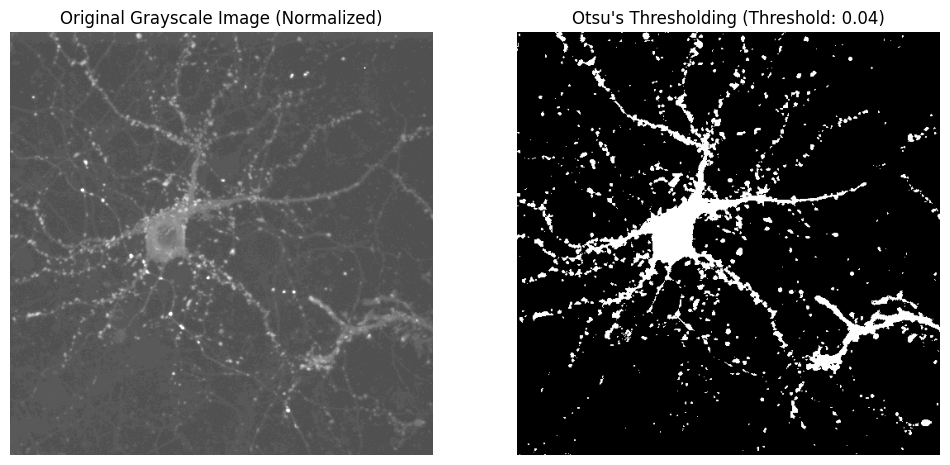

In [ ]:
# Function to display the raw and Otsu's thresholded images side by side
def display_otsu_thresholding():
    # Convert normalized image back to 8-bit for thresholding
    image_8bit = (normalized_image * 255).astype('uint8')

    # Apply Otsu's thresholding
    otsu_thresh_value = filters.threshold_otsu(image_8bit)
    _, otsu_thresh = cv2.threshold(image_8bit, otsu_thresh_value, 255, cv2.THRESH_BINARY)

    # Normalize the thresholded image to range [0, 1]
    otsu_thresh = otsu_thresh / 255.0

    # Display the original and Otsu's thresholded images in a 1x2 format
    plt.figure(figsize=(12, 6))

    # Original image
    plt.subplot(1, 2, 1)
    plt.imshow(normalized_image, cmap='gray', vmin=0, vmax=0.1)
    plt.title('Original Grayscale Image (Normalized)')
    plt.axis('off')

    # Otsu's thresholding
    plt.subplot(1, 2, 2)
    plt.imshow(otsu_thresh, cmap='gray', vmin=0, vmax=1)
    plt.title(f'Otsu\'s Thresholding (Threshold: {otsu_thresh_value/255:.2f})')
    plt.axis('off')

    plt.show()

# Display the images
display_otsu_thresholding()

* Advanced Methods: \
 **b. Niblack's method** \\
Instead of calculating a single global threshold for the entire image, several thresholds are calculated for every pixel by using specific formulae that take into account the mean and standard deviation of the local neighborhood (defined by a window centered around the pixel).

In [ ]:
# Function to display the raw and Niblack's thresholded images side by side
def display_niblack_thresholding(window_size, k):
    # Apply Niblack's thresholding
    niblack_thresh = filters.threshold_niblack(normalized_image, window_size=window_size, k=k)
    niblack_binary = normalized_image > niblack_thresh

    # Display the original and Niblack's thresholded images in a 1x2 format
    plt.figure(figsize=(12, 6))

    # Original image
    plt.subplot(1, 2, 1)
    plt.imshow(normalized_image, cmap='gray', vmin=0, vmax=0.1)
    plt.title('Original Grayscale Image (Normalized)')
    plt.axis('off')

    # Niblack's thresholding
    plt.subplot(1, 2, 2)
    plt.imshow(niblack_binary, cmap='gray', vmin=0, vmax=1)
    plt.title(f'Niblack\'s Thresholding\n(Window Size: {window_size}, k: {k})')
    plt.axis('off')

    plt.show()

# Create interactive sliders for window size and k value
window_size_slider = widgets.IntSlider(min=3, max=51, step=2, value=15)
k_slider = widgets.FloatSlider(min=-1.0, max=1.0, step=0.01, value=0.2)

interact(display_niblack_thresholding, window_size=window_size_slider, k=k_slider)

# Display the interactive widgets
display(window_size_slider)
display(k_slider)


interactive(children=(IntSlider(value=15, description='window_size', max=51, min=3, step=2), FloatSlider(value…

IntSlider(value=15, description='window_size', max=51, min=3, step=2)

FloatSlider(value=0.2, description='k', max=1.0, min=-1.0, step=0.01)

## **5. Feature Extraction, Edge Detection**
<a name='edge-detection'></a>
Feature extraction is a fundamental process in image processing and computer vision, enabling the transformation of raw image data into meaningful numerical features. The most commonly used tools are edge detection, corner detection, blob detection, texture analysis, shape identification etc.

* **a. Edge Detection -> Canny Filter** \\
Edge detection is one of the fundamental image-processing tasks used in various Computer Vision tasks to identify the boundary or sharp changes in the pixel intensity. It plays a crucial role in object detection, image segmentation and feature extraction from the image.

Downloading...
From: https://drive.google.com/uc?id=1Dvdh1aSFOr4rVUHYXbJESrbV9PUQMte9
To: /content/grayscale_image.tif
100%|██████████| 2.95M/2.95M [00:00<00:00, 175MB/s]


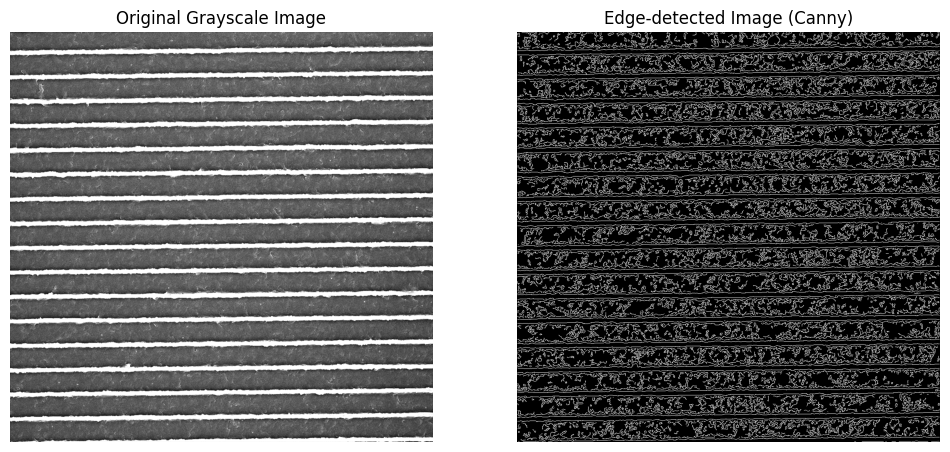

In [ ]:
# Download the image from the shared Google Drive link
url = 'https://drive.google.com/uc?id=1Dvdh1aSFOr4rVUHYXbJESrbV9PUQMte9'
output = '/content/grayscale_image.tif'
gdown.download(url, output, quiet=False)

# Load the .tif image using tifffile
image = tiff.imread(output)

# Convert the image to grayscale (if not already grayscale)
if len(image.shape) > 2 and image.shape[2] == 3:
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
else:
    image_gray = image

# Apply Canny edge detection
edges = feature.canny(image_gray)

# Plot the original and edge-detected images side by side
plt.figure(figsize=(12, 6), dpi =100)

# Original image
plt.subplot(1, 2, 1)
plt.imshow(image_gray, cmap='gray')
plt.title('Original Grayscale Image')
plt.axis('off')

# Edge-detected image
plt.subplot(1, 2, 2)
plt.imshow(edges, cmap='gray')
plt.title('Edge-detected Image (Canny)')
plt.axis('off')

plt.show()


Apply Gaussian blur to reduce noise and smoothen edges:

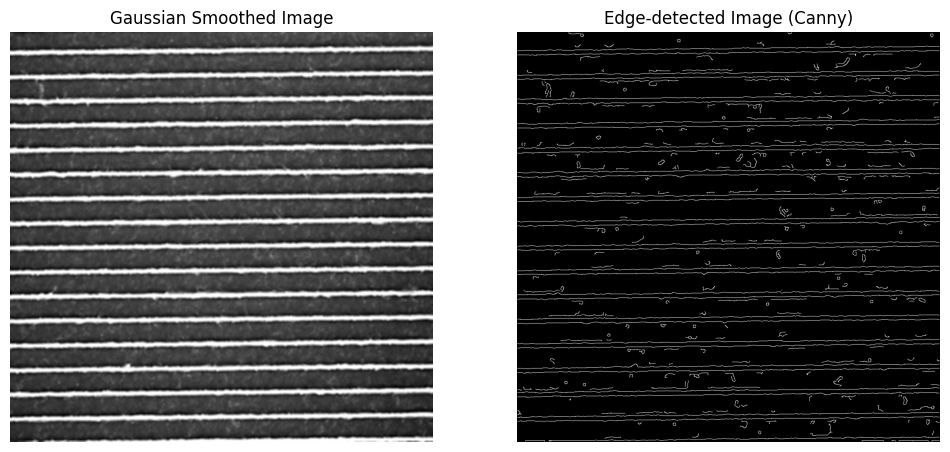

In [ ]:
blurred = cv2.GaussianBlur(src=image_gray, ksize=(7, 7), sigmaX=3)

# Perform Canny edge detection
edges_blurred = feature.canny(blurred)

# Plot the original and edge-detected images side by side
plt.figure(figsize=(12, 6),dpi=100)

# Smoothed image
plt.subplot(1, 2, 1)
plt.imshow(blurred, cmap='gray')
plt.title('Gaussian Smoothed Image')
plt.axis('off')

# Edge-detected image
plt.subplot(1, 2, 2)
plt.imshow(edges_blurred, cmap='gray')
plt.title('Edge-detected Image (Canny)')
plt.axis('off')

plt.show()


* **a. Edge Detection -> Sobel Filter** \\

Downloading...
From: https://drive.google.com/uc?id=1fBZlpVlquhg0gDtRdiwpMuJKP8rsXbpc
To: /content/grayscale_image.tif
100%|██████████| 295k/295k [00:00<00:00, 50.7MB/s]


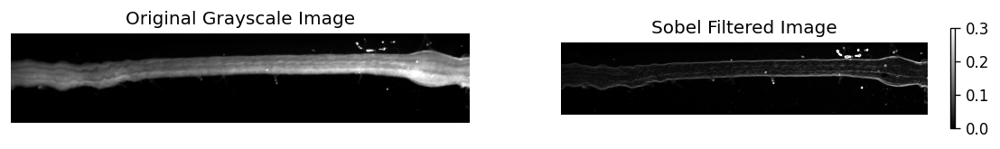

In [ ]:
# Download the image from the shared Google Drive link
url = 'https://drive.google.com/uc?id=1fBZlpVlquhg0gDtRdiwpMuJKP8rsXbpc'
output = '/content/grayscale_image.tif'
gdown.download(url, output, quiet=False)

# Load the .tif image using tifffile
image = tiff.imread(output)

# Convert the image to grayscale (if not already grayscale)
if len(image.shape) > 2 and image.shape[2] == 3:
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
else:
    image_gray = image

# Apply Sobel filter
sobel_edges = filters.sobel(image_gray)

# Plot the original and Sobel-filtered images side by side
plt.figure(figsize=(12, 6), dpi = 120)

# Original image
plt.subplot(1, 2, 1)
plt.imshow(image_gray, cmap='gray')
plt.title('Original Grayscale Image')
plt.axis('off')

# Sobel-filtered image
plt.subplot(1, 2, 2)
plt.imshow(sobel_edges, cmap='gray', vmin = 0.0, vmax = 0.3); plt.colorbar(shrink = 0.2)
plt.title('Sobel Filtered Image')
plt.axis('off')

plt.show()


* **b. Blob Detection** \\
Blobs are bright on dark or dark on bright regions in an image.

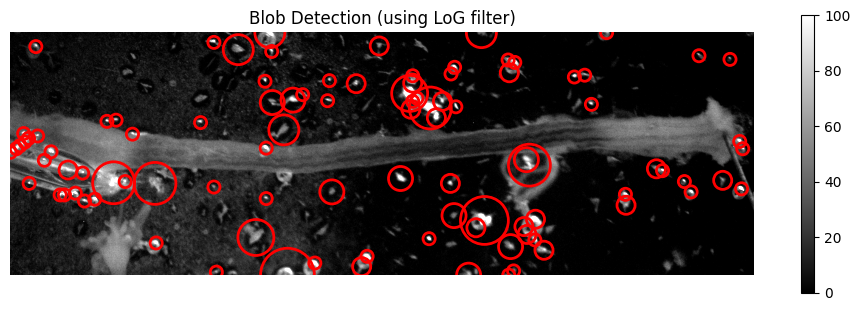

In [ ]:
# # Download the image from the shared Google Drive link
# url = 'https://drive.google.com/uc?id=1tyQ_Fi2Xl-lNkoWixgS7qlITP8wR0NQx'
# output = '/content/grayscale_image.tiff'
# gdown.download(url, output, quiet=False)

# # Load the .tif image using tifffile
# image = tiff.imread(output)

# Perform blob detection using the Laplacian of Gaussian (LoG) method
blobs_log = blob_log(image, min_sigma = 2, max_sigma=50, num_sigma=50, threshold=0.1)

# Compute radii in the 3rd column
blobs_log[:, 2] = blobs_log[:, 2] * 5  # can change this number

# Plot the original image with detected blobs
plt.figure(figsize=(12, 12))

plt.imshow(image, cmap='gray', vmin = 0, vmax = 100); plt.colorbar(shrink = 0.3)
plt.title('Blob Detection (using LoG filter)')
plt.axis('off')

# Draw circles on the detected blobs
for blob in blobs_log:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='red', linewidth=2, fill=False)
    plt.gca().add_patch(c)

plt.show()


* Different Blob Detection Methods:


1.  Laplacian of Gaussian (LoG)
2.  Difference of Gaussian (DoG)
3.  Determinant of Hessian (DoH)



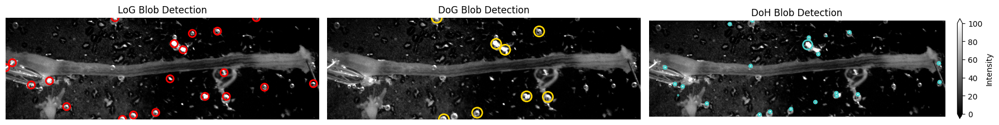

In [ ]:
# Perform blob detection using LoG, DoG, and DoH methods
blobs_log = blob_log(image, min_sigma=10, max_sigma=30, num_sigma=10, threshold=0.1, overlap=0.5)   # Laplacian of Gaussian
blobs_dog = blob_dog(image, min_sigma=10, max_sigma=50, sigma_ratio=1.6, threshold=0.1, overlap=0.5)      # Difference of Gaussian
blobs_doh = blob_doh(image, min_sigma=1, max_sigma=30, num_sigma=10, threshold=0.01, overlap=0.5, log_scale=False)     # Determinant of Hessian

# Compute radii for blobs detected by LoG
blobs_log[:, 2] = blobs_log[:, 2] * np.sqrt(2)

# Compute radii for blobs detected by DoG
blobs_dog[:, 2] = blobs_dog[:, 2] * np.sqrt(2)

# Compute radii for blobs detected by DoH
blobs_doh[:, 2] = blobs_doh[:, 2] * np.sqrt(2)

# Compute radii for blobs detected by DoG
blobs_dog[:, 2] = blobs_dog[:, 2] * np.sqrt(2)

# Plot the original image with detected blobs
fig, axes = plt.subplots(1, 3, figsize=(18, 6),dpi=100)
ax = axes.ravel()

# Plot LoG results
ax[0].imshow(image, cmap='gray',vmin=0,vmax=100);
ax[0].set_title('LoG Blob Detection')
ax[0].axis('off')
for blob in blobs_log:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='red', linewidth=2, fill=False)
    ax[0].add_patch(c)

# Plot DoG results
ax[1].imshow(image, cmap='gray',vmin=0,vmax=100)
ax[1].set_title('DoG Blob Detection')
ax[1].axis('off')
for blob in blobs_dog:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='gold', linewidth=2, fill=False)
    ax[1].add_patch(c)

# Plot DoH results
plot = ax[2].imshow(image, cmap='gray',vmin=0,vmax=100)
ax[2].set_title('DoH Blob Detection')
ax[2].axis('off')
# plt.colorbar(plot, ax=ax[2], shrink=0.4)

cbar1 = fig.colorbar(plot, ax=ax[2], fraction=0.016, pad=0.04, cmap='viridis', orientation='vertical', extend='both')
cbar1.set_label('Intensity')

for blob in blobs_doh:
    y, x, r = blob
    c = plt.Circle((x, y), r, color='mediumturquoise', linewidth=2, fill=False)
    ax[2].add_patch(c)

plt.tight_layout()

plt.show()


* **c. SIFT (Scale-Invariant Feature Transform):** \\
SIFT is a widely used method for detecting and describing local features in images. It identifies keypoints in the image that are invariant to scale, rotation, and illumination changes. These descriptors are highly distinctive and robust, making them suitable for tasks like object recognition, image stitching, and 3D reconstruction.

Downloading...
From: https://drive.google.com/uc?id=1-k49CSloItMjCIDZs2Qx19U8CX3q9Xu2
To: /content/image.tif
100%|██████████| 525k/525k [00:00<00:00, 64.9MB/s]


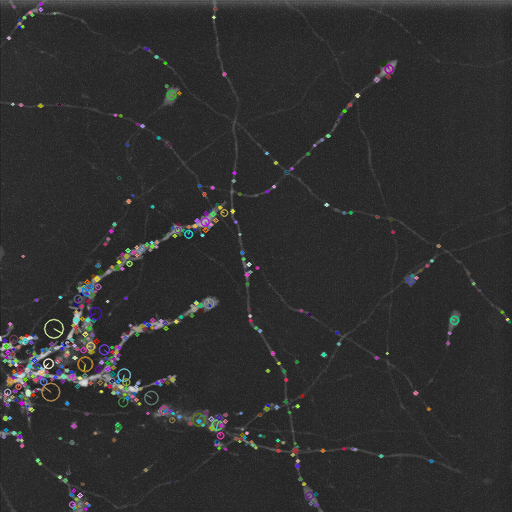

In [ ]:
# Download the TIFF file from the shared Google Drive link
url = 'https://drive.google.com/uc?id=1-k49CSloItMjCIDZs2Qx19U8CX3q9Xu2'
output = '/content/image.tif'  # Path to save the downloaded file

gdown.download(url, output, quiet=False)

# Load the TIFF file using OpenCV
img2 = cv2.imread(output, cv2.IMREAD_UNCHANGED)

# The declaration of CLAHE
# clipLimit -> Threshold for contrast limiting
clahe = cv2.createCLAHE(clipLimit=40.0, tileGridSize=(10,10))
final_img = clahe.apply(img2) + 30;

# Normalize the image to range [0, 1]
normalized_image = final_img / np.max(final_img)

image_8bit = (normalized_image * 255).astype('uint8')

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Detect keypoints and descriptors
keypoints, descriptors = sift.detectAndCompute(image_8bit, None)

# Draw keypoints on the image
image_with_keypoints = cv2.drawKeypoints(image_8bit, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display the image with keypoints in Colab
cv2_imshow(image_with_keypoints)


## **6. Morphological Operations**
<a name='morph-operations'></a>
* **Connected Components and Skeletonization**

In [ ]:
# Mount Google Drive
# drive.mount('/content/drive')

# Define the file path (you might need to adjust the path)
file_path = '/content/MAX_proj_div23_DUP_MAX_D4_timelapse1.tif'

# Load the .tif image
image = io.imread(file_path, as_gray=True)

# Using CLAHE for better contrast
clahe = cv2.createCLAHE(clipLimit=40.0, tileGridSize=(10,10))
final_img = clahe.apply(image) + 30;

# Normalize the image to range [0, 1]
normalized_image = final_img / np.max(final_img)

# Convert the normalized image back to 8-bit for Otsu-thresholding
image_8bit = (normalized_image * 255).astype('uint8')

# Apply Otsu's thresholding
otsu_thresh_value = filters.threshold_otsu(image_8bit)
_, otsu_thresh = cv2.threshold(image_8bit, otsu_thresh_value, 255, cv2.THRESH_BINARY)

# Normalize the thresholded image to range [0, 1]
otsu_thresh = otsu_thresh / 255.0

binary_mask = otsu_thresh > 0.3  # Adjust threshold as needed

# Label the connected components
label_image = measure.label(binary_mask)
properties = measure.regionprops(label_image)

# Find the 5 largest connected components
largest_components = sorted(properties, key=lambda x: x.area, reverse=True)[:5]

# Create a binary mask for the 5 largest components
largest_components_mask = np.zeros_like(label_image, dtype=bool)
for component in largest_components:
    largest_components_mask[label_image == component.label] = True

# Skeletonize the binary mask
skeleton = skeletonize(largest_components_mask)

# Remove small branches
min_branch_size = 15  # Adjust the minimum size of branches to remove (default value was 5)
clean_skeleton = remove_small_objects(skeleton, min_size=min_branch_size)

# Find branching points
def find_branching_points(skeleton):
    branching_points = np.zeros_like(skeleton, dtype=bool)
    for i in range(1, skeleton.shape[0] - 1):
        for j in range(1, skeleton.shape[1] - 1):
            if skeleton[i, j]:
                neighbors = skeleton[i-1:i+2, j-1:j+2]
                if np.sum(neighbors) > 3:  # Branching point has more than two neighbors
                    branching_points[i, j] = True
    return branching_points

# Find individual branching points
branching_points = find_branching_points(clean_skeleton)

# Calculate distances from the skeleton
distance_map = np.zeros_like(clean_skeleton, dtype=float)
branch_coords = np.argwhere(branching_points)
for coord in branch_coords:
    distances = distance_transform_edt(~clean_skeleton, return_indices=False, return_distances=True)
    distance_map += distances

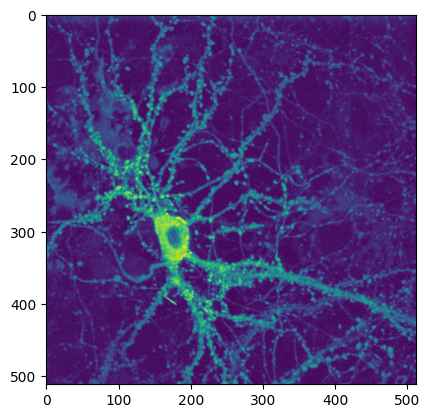

In [ ]:
fig,ax = plt.subplots(1,1,dpi=100)
ax.imshow(image_8bit)

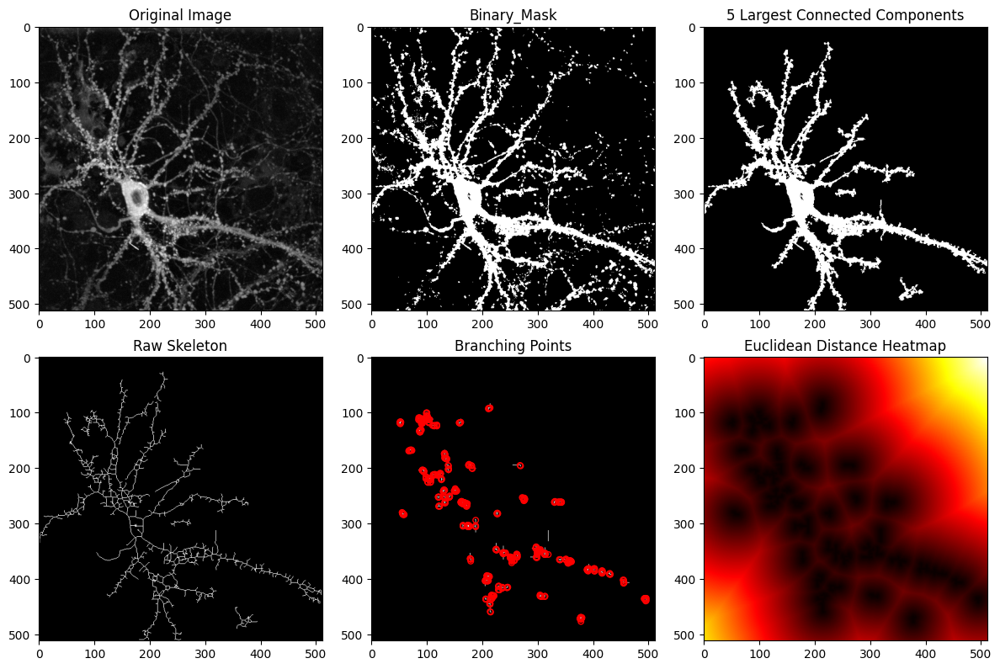

In [ ]:
## Plotting the results

fig, axes = plt.subplots(2, 3, figsize=(12, 8))

# Original image
axes[0,0].imshow(normalized_image, cmap='gray')
axes[0,0].set_title('Original Image')

# Binary Mask (after CLAHE and Otsu-thresholding)
axes[0,1].imshow(binary_mask, cmap='gray')
axes[0,1].set_title('Binary_Mask')

# 5 Largest connected components
axes[0,2].imshow(largest_components_mask, cmap='gray')
axes[0,2].set_title('5 Largest Connected Components')

# Clean skeleton
axes[1,0].imshow(skeleton, cmap='gray')
axes[1,0].set_title('Raw Skeleton')

# Branching points highlighted
axes[1,1].imshow(clean_skeleton, cmap='gray')
for coord in branch_coords:
    circ = plt.Circle((coord[1], coord[0]), radius=5, color='red', fill=False)
    axes[1,1].add_patch(circ)
axes[1,1].set_title('Branching Points')

# Euclidean distance heatmap
plot = axes[1,2].imshow(distance_map, cmap='hot')
axes[1,2].set_title('Euclidean Distance Heatmap')

plt.tight_layout()
plt.show()

* Show Outline of the binary mask

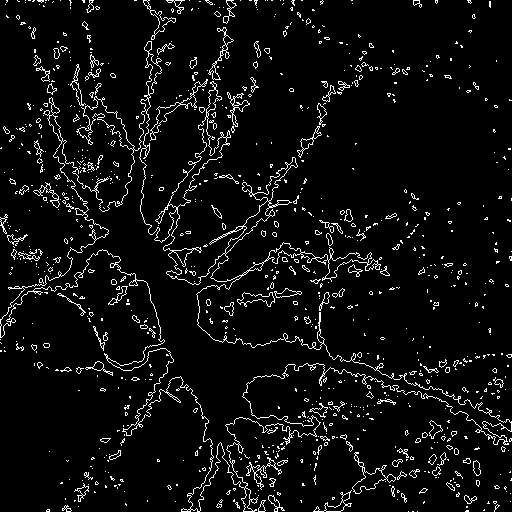

In [ ]:
binary_mask = binary_mask.astype(np.uint8)     # convert to 8-bit integer

# Create a black image (all zeros) of the same size as the mask for drawing contours
contour_img = np.zeros_like(binary_mask, dtype=np.uint8)

# Find contours of the binary mask
contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw contours on the black image
cv2.drawContours(contour_img, contours, -1, (255, 255, 255), thickness=1)

# Display the result
cv2_imshow(contour_img)
cv2.waitKey(0)
cv2.destroyAllWindows()


* Show Outline of the L.C.C (Largest Connected Components)

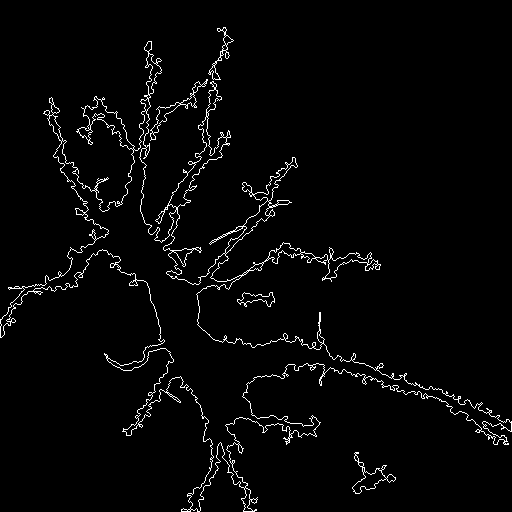

In [ ]:
lcc_mask = largest_components_mask.astype(np.uint8)     # convert to 8-bit integer

# Create a black image (all zeros) of the same size as the mask for drawing contours
contour_img = np.zeros_like(lcc_mask, dtype=np.uint8)

# Find contours of the binary mask
contours, _ = cv2.findContours(lcc_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw contours on the black image
cv2.drawContours(contour_img, contours, -1, (255, 255, 255), thickness=1)

# Display the result
cv2_imshow(contour_img)
cv2.waitKey(0)
cv2.destroyAllWindows()

* Measuring the perimeter length of the outline (Unit: number of pixels)

In [ ]:
peri = measure.perimeter(lcc_mask); peri

9930.470339733307

* Check if we have a low-contrast image (TRUE if 'yes')

In [ ]:
flag = exposure.is_low_contrast(image, fraction_threshold=0.05, lower_percentile=1, upper_percentile=99, method='linear')
print (flag)

True


* **`Morphological Closing: Dilation and Erosion**  
The closing operation dilates an image and then erodes the dilated image, using the same structuring element for both operations. Morphological closing is useful for filling small holes in an image while preserving the shape and size of large holes and objects in the image.

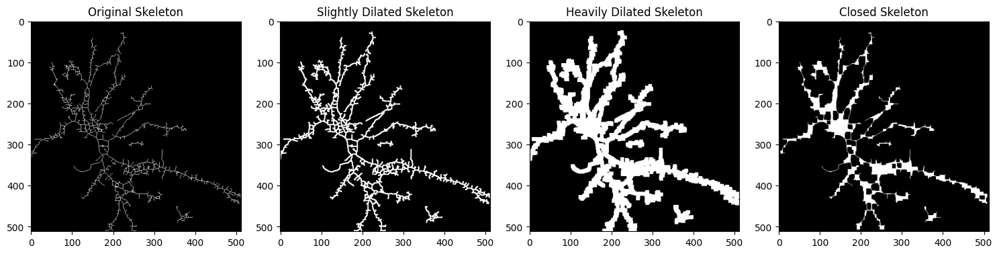

In [ ]:
# Perform dilation
dilated_skeleton1 = binary_dilation(skeleton, structure=np.ones((3,3)))
dilated_skeleton2 = binary_dilation(skeleton, structure=np.ones((9,9)))

# Perform erosion
eroded_mask = binary_erosion(dilated_skeleton2, structure=np.ones((9,9)))

# Plotting
fig, axes = plt.subplots(1, 4, figsize=(15, 10))

axes[0].imshow(skeleton, cmap='gray')
axes[0].set_title('Original Skeleton')

axes[1].imshow(dilated_skeleton1, cmap='gray')
axes[1].set_title('Slightly Dilated Skeleton')

axes[2].imshow(dilated_skeleton2, cmap='gray')
axes[2].set_title('Heavily Dilated Skeleton')

axes[3].imshow(eroded_mask, cmap='gray')
axes[3].set_title('Closed Skeleton')

plt.tight_layout()
plt.show()



* **`Morphological Opening: Erosion and Dilation** \\
Opening removes small objects from the foreground (usually taken as the bright pixels) of an image, placing them in the background.

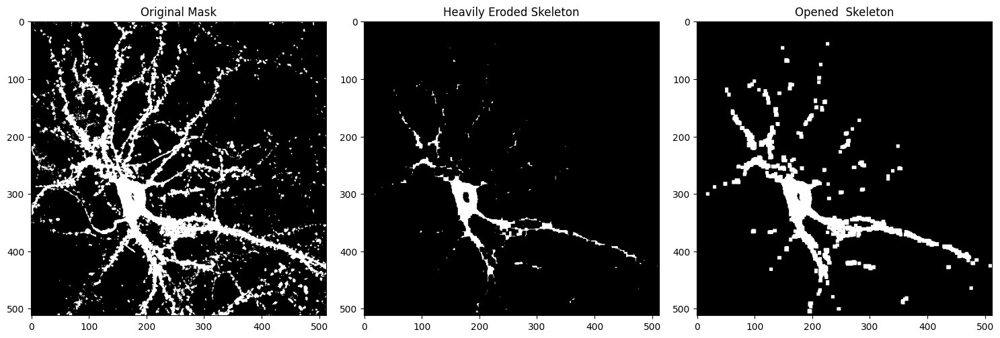

In [ ]:
# Perform erosion
eroded_mask = binary_erosion(binary_mask, structure=np.ones((6,6)))

# Perform dilation
dilated_skeleton = binary_dilation(eroded_mask, structure=np.ones((6,6)))

# Plotting
fig, axes = plt.subplots(1, 3, figsize=(15, 10))

axes[0].imshow(binary_mask, cmap='gray')
axes[0].set_title('Original Mask')

axes[1].imshow(eroded_mask, cmap='gray')
axes[1].set_title('Heavily Eroded Skeleton')

axes[2].imshow(dilated_skeleton, cmap='gray')
axes[2].set_title('Opened  Skeleton')

plt.tight_layout()
plt.show()


## **Limitations?** ##